# FourCastNet - High Resolution Weather Prediction

FourCastNet, short for Fourier ForeCasting Neural Network, is a global data-driven weather forecasting model that provides accurate short to medium-range global predictions at 0.25° resolution, which corresponds to a spatial resolution of roughly 30 km × 30 km near the equator and a global grid size of 720 × 1440 pixels. FourCastNet accurately forecasts high-resolution, fast-timescale variables such as surface wind speed, precipitation, and atmospheric water vapour. FourCastNet is about 45,000 times faster than traditional NWP models on a node-hour basis. This orders of magnitude speedup, along with the unprecedented accuracy of FourCastNet at high resolution, enables the inexpensive generation of extremely large ensemble forecasts. This approach dramatically improves probabilistic weather forecasting.

This notebook implements the high resolution weather prediction model described in the following paper: https://arxiv.org/pdf/2202.11214.pdf
 
<p style="text-align:center;">
    <img src="../assets/FourCastNet-1.png" width="500" height="700" class="center">
</p>   

## Data Description

The data used in this project is called ERA5 and is publicly available by ECMWF. It is a comprehensive dataset that consists of hourly estimates of many atmospheric variables at a latitude and longitude resolution of 0.25&deg; from the Earth's surface to roughly 100 km altitude from 1979 to the present day. ERA5 is an atmospheric reanalysis dataset processed at the high-performance computing facility at ECMWF. It is the result of an optimal combination of observations from various measurement sources and the output of a numerical model using a Bayesian estimation process called data-assimilation. The dataset is essentially a reconstruction of the optimal estimate of the observed history of the Earth’s atmosphere.

## Setting Up

This section deals with the necessary setup steps to run the notebook. Initially, the current root directory must be changed to the current working directory to call the code and data files relative to the project folder. Then the modules required for this project will be loaded. 

#### Change Current Working Directory

In [1]:
import os

# TODO: Change the path to the current working directory [Make sure you are in /FourCastNet and not /FourCastNet/notebooks]
DIR = "/CURRENT/WORKING/DIRECTORY/"
DIR = "/scratch/fp0/rxm900/FourCastNet/"
os.chdir(DIR)

#### Load modules

In [2]:
# Load required modules
import sys
import time
import numpy as np
import argparse
from numpy.core.numeric import False_
import h5py
import torch
import torchvision
from torchvision.utils import save_image
import torch.nn as nn
import torch.cuda.amp as amp
import torch.distributed as dist
from collections import OrderedDict
from torch.nn.parallel import DistributedDataParallel
import logging
from utils import logging_utils
from utils.weighted_acc_rmse import weighted_rmse_torch_channels, weighted_acc_torch_channels, unweighted_acc_torch_channels, weighted_acc_masked_torch_channels
logging_utils.config_logger()
from utils.YParams import YParams
from utils.data_loader_multifiles import get_data_loader
from networks.afnonet import AFNONet
import wandb
import matplotlib.pyplot as plt
import glob
from datetime import datetime
from matplotlib.widgets import Slider
import time
import matplotlib.colors as colors
import matplotlib.image as mpimg
from matplotlib import rcParams
import matplotlib.animation as animation
from IPython.display import HTML
import pandas as pd
import hvplot.pandas
%matplotlib inline 

2023-04-14 13:39:08,642 - numexpr.utils - INFO - Note: detected 96 virtual cores but NumExpr set to maximum of 64, check "NUMEXPR_MAX_THREADS" environment variable.
2023-04-14 13:39:08,643 - numexpr.utils - INFO - Note: NumExpr detected 96 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.


## 1. Multi-layer transformer architecture with Adaptive Fourier Neural Operator

<p style="text-align:center;">
    <img src="../assets/FourCastNet-2.png" width="500" height="700" class="center">
</p>   

The multi-layer transformer architecture utilizes the Adaptive Fourier Neural Operator with shared MLP and frequency soft-thresholding for spatial token mixing. The input frame (720x1440 lat-lon grid) is first projected to a 2D grid ($h × w$) of patches, where each patch has a small size $p × p × c$. Each patch is then embedded in a higher dimensional space with high number of latent channels (AFNO layers) and position embedding is added to form a sequence of tokens. Each layer recieves an input tensor of patches $X \in \mathbb{R}^{h x w x c}$ and performs spatial mixing followed by channel mixing. The spatial mixing happens in the Fourier domain as follows:
1. Transform tokens to the Fourier domain with $z_{m,n} = [DFT(X)]_{m,n}$, where m, n index the patch location and DFT denotes a 2D discrete Fourier transform.
2. Apply token weighting in the Fourier domain, and promote sparsity with a Soft-Thresholding and Shrinkage operation as $z_{m,n} = S_λ(MLP(z_{m,n}))$, where $S_λ(x) = sign(x) max(|x| − λ, 0)$ with the sparsity controlling parameter $λ$, and MLP() is a 2-layer multi-layer perceptron with block-diagonal weight matrices which are shared across all patches. 
3. Inverse Fourier to transform back to the patch domain and add a residual connection as $y_{m,n} = [IDFT(Z^~)]_{m,n} + X_{m,n}$.   
  
This process is repeated for $L$ layers, and finally a linear decoder reconstructs the patches for the next frame from the final embedding.

### Training

In the pre-trainig step, the AFNO model is trained using a supervised learning approach using a dataset modeled to capture the interactions between the complex atmospheric variables. The primary interest in this project lies in forecasting the wind velocities and precipitation, and thus the variables are specifically chosen to model the most important processes that influence low-level winds and precipitation. 

Each of the chosen variables are re-gridded from a Gaussian grid to a regular Euclidean grid using the standard interpolation scheme provided by the Copernicus Climate Data Store (CDS) Application Programming Interface (API). Following the re-gridding process, each of the 20 variables is represented as a 2D field of shape (721 × 1440) pixels. Thus, a single training data point at an instant in time containing all 20 variables is represented by a tensor of shape (721 × 1440 × 20). While the ERA5 dataset is available at a temporal resolution of 1 hour, the dataset is sub-sampled and snapshots spaced 6 hours apart are used to train our model. Within each 24 hour day, the 20 variable subset of the ERA5 dataset at 0000 hrs, 0600 hrs, 1200 hrs and 1800 hr is sampled.

The pre-trained model is referred to as *backbone*. This model is used to forecast wind velocities. There is an additional step to train the precipitation model which is described in section 3.

### Plots of time_means in 21 channels.

The time_means data file consists of normalized statistics of the 21 channels/variables available in the ERA5 dataset at constant time intervals after the re-gridding process as described above, which are used to train the *backbone* model. These statistics have been visualized below for each individual variable. 

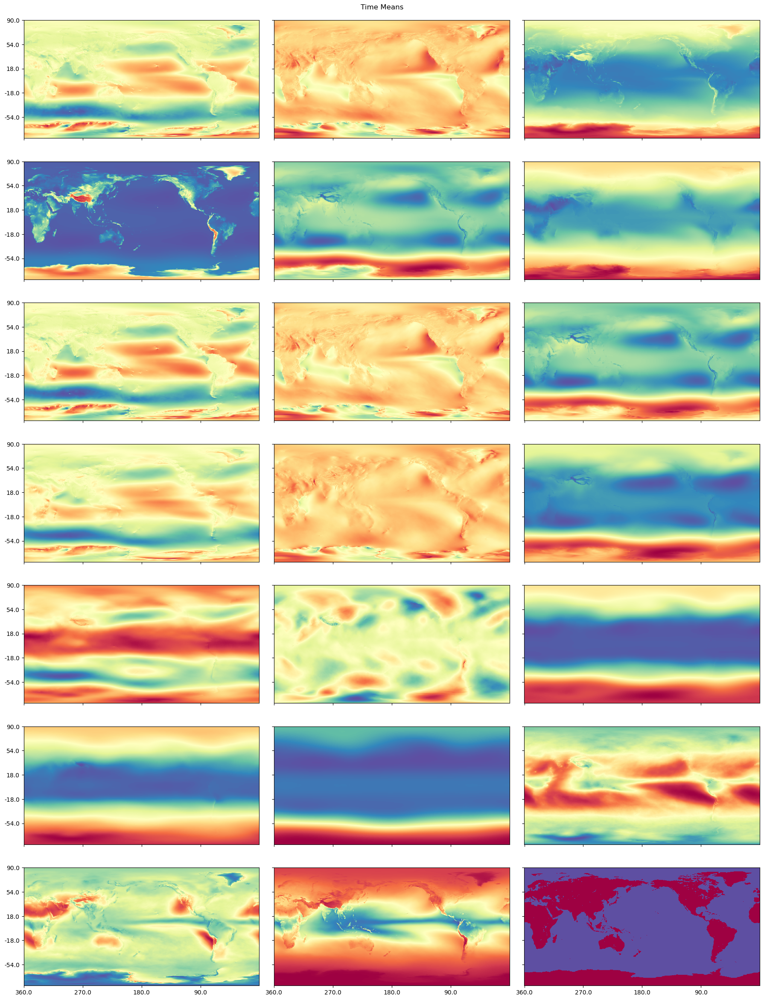

In [3]:
%matplotlib inline
filename = '/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/data/stats/time_means.npy'
time_means = np.load(filename)

plt.rcParams["figure.figsize"] = [18.0, 24.0]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots(7,3, sharey=True, sharex=True) 
plt.setp(ax, xticks=np.arange(0, 1440, step=360), xticklabels=["360.0","270.0","180.0","90.0"],
         yticks=np.arange(0, 741, step=148), yticklabels=["90.0","54.0","18.0","-18.0","-54.0", "-90.0"] ) 
plt.suptitle("Time Means")
colormap = 'Spectral'
def display_func():
    for i in range(0,7):
        for j in range(0,3):
                ax[i][j].imshow(time_means[0][i*3+j], interpolation='nearest', cmap=colormap, animated=True) 
                
display_func();

### Orography and Land Sea Mask
This section implements the visualization for orography and land sea mask data.  
  
Orography is the study of the topographic relief of mountains, and can more broadly include hills, and any part of a region's elevated terrain. Different terrains can affect weather and wind movement, and different heights are highlighted with different colors in the map below.
  
The land sea mask data helps visualize the separation of land and water bodies on the planet.
 
 

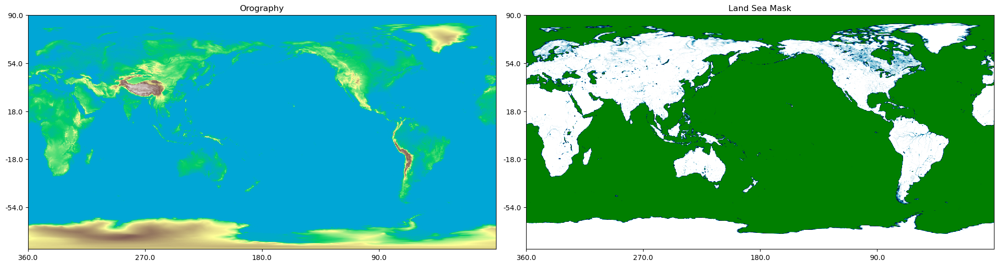

In [4]:
%matplotlib inline
rcParams['figure.figsize'] = (20,10)
filename = '/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/data/FCN_ERA5_data/static/orography.h5'
with h5py.File(filename, 'r') as f1:
    orog = f1['orog'][()]     
filename = '/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/data/stats/land_sea_mask.npy'
land_sea_mask = np.load(filename)
  
fig, ax = plt.subplots(1,2, sharex=True)
plt.setp(ax, xticks=np.arange(0, 1440, step=360), xticklabels=["360.0","270.0","180.0","90.0"],
         yticks=np.arange(0, 741, step=148), yticklabels=["90.0","54.0","18.0","-18.0","-54.0", "-90.0"] ) 
ax[0].set_title("Orography")
colormap = 'terrain' 
ax[0].imshow(orog, interpolation='nearest', cmap=colormap, vmin=-1.95)
ax[1].set_title("Land Sea Mask")
colormap = 'ocean'
ax[1].imshow(land_sea_mask, interpolation='nearest', cmap=colormap)
plt.show()

### Inference with pre-trained model

The following is an illustrative example of using the FourCastNet model to forecast atospheric rivers. Atmospheric rivers are an important climatic phenomenon, and are akin to rivers in the sky. They are responsible for causing extreme precipitation and flooding. They contribute significantly to the supply of precipitable water in several parts of the world. 

Panels (a)-(c) visualize the *Total Column Water Vapor (TCWV)* in a FourCastNet model forecast. Panel (a) Shows the *TCWV* field in the initial condition that was used to initialize the FourCastNet model. Panels (b) and (c) show the forecasts of the *TCWV* field produced by the FourCastNet model (top panels) at lead times of 36 and 72 hours respectively along with the corresponding true *TCWV* fields at those instants of time.

<p style="text-align:center;">
    <img src="../assets/FourCastNet-3.png" width="600" height="700" class="center">
</p>  

#### Forecast core atmospheric variables

We implement inference in autoregressive mode to generate forecasts for the wind velocity variables used to train the model.

**Note**: If the user does not want to run inference, NCI has created the inference outputs under “/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab". For your convenience, each path to the output has been assigned in the visualization cells below and commented out.

In the following cells, we store the names of the different channels in the dataset for the purpose of visualization.

In [5]:
from inference_nci import data_loader
namelist=[]
for i in range(20):
    namelist.append(data_loader.channel_to_var(i))
namelist

['10u',
 '10v',
 '2t',
 'sp',
 'msl',
 't850',
 'u1000',
 'v1000',
 'z1000',
 'u850',
 'v850',
 'z850',
 'u500',
 'v500',
 'z500',
 't500',
 'z50',
 'r500',
 'r850',
 'tcwv']

In [6]:
# The channel names in the order of stored array.
namelist=['u10','v10','t2m','sp','msl',
          't850','u1000','v1000','z1000','u850',
          'v850','z850','u500','v500','z500',
          't500','z50','r500','r850','tcwv']

The following cell runs a bash script using a magic function. [Click here](https://ipython.readthedocs.io/en/stable/interactive/magics.html) for more information about magic functions.

**%%time** is used to print the execution time of the statement.  
**%%capture** is used to run the cell, capturing stdout, stderr, and IPython’s rich display() calls.  
**%%bash** is used to call the python script with bash as a subprocess.  

The bash script runs an instance of the inference model using the AFNO architecture to generate inference output for wind variables. 

In [ ]:
%%time
%%capture
%%bash
python inference/inference.py --config=afno_backbone --run_num=0 --vis   \
        --weights '/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/pretrained/backbone.ckpt' \
        --override_dir './output'  

#### Plot RMSE and acc over all channels.
The following cells use the output file generated by inference to visualize the RMSE and acc values over all the channels in the dataset. 

In [7]:
# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab/autoregressive_predictions_z500_vis.h5'

filename = './output/autoregressive_predictions_z500_vis.h5'
df = pd.DataFrame(np.array(h5py.File(filename)['rmse'][0]))
df.columns = namelist
df.hvplot(y=namelist, alpha=0.5, value_label='RMSE',legend=False,xlabel="Predicted timestep")

:NdOverlay   [Variable]
   :Curve   [index]   (RMSE)

In [8]:
# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab/autoregressive_predictions_z500_vis.h5'

filename = './output/autoregressive_predictions_z500_vis.h5'
df = pd.DataFrame(np.array(h5py.File(filename)['acc'][0]))
df.columns = namelist
df.hvplot(y=namelist, alpha=0.5, value_label='acc',legend=False,xlabel="Predicted timestep")

:NdOverlay   [Variable]
   :Curve   [index]   (acc)

#### Prediction vs Ground truth
The following is an illustrative example of using the ForeCastNet model forecast. The example presents an animation to compare the prediction results from inference against the ground truth data. 

In [ ]:
layer=16
with h5py.File(filename, 'r') as f1:
    pred = f1['predicted'][0,:,layer,:,:]  
    ground_t = f1['ground_truth'][0,:,layer,:,:]  

plt.rcParams['animation.embed_limit'] = 2**128    
plt.rcParams["figure.figsize"] = [10,10]
fig, ax = plt.subplots(2)
plt.setp(ax, xticks=np.arange(0, 1440, step=360), xticklabels=["360.0","270.0","180.0","90.0"],
         yticks=np.arange(0, 741, step=148), yticklabels=["90.0","54.0","18.0","-18.0","-54.0", "-90.0"] ) 
fig.set_tight_layout(False) 
ax[0].set_title("Prediction")
ax[1].set_title("Ground Truth")
plt.suptitle ("Inference") 

color_map ='Spectral_r'
inter = 'nearest'
mi = np.min (ground_t[0])
mx = np.max (ground_t[0])

def update(val):
   ax[0].imshow(pred[val], cmap=color_map, interpolation = inter , vmin=mi, vmax=mx)
   ax[1].imshow(ground_t[val], cmap=color_map, interpolation = inter , vmin=mi, vmax=mx)  

ani = animation.FuncAnimation(fig, update, frames=len(pred))
plt.close()
from matplotlib import rc
rc('animation', html='jshtml')
ani

### 2. Ensemble Inference with pre-trained model
In this section of the notebook, we run the ensemble inference model for batched inference. This model submits parallelized jobs for the model with different initial configurations. The following call to inference_ensemble uses 10 perturbations and the AFNO architecture.

In [ ]:
%%time
%%bash 
python inference/inference_ensemble.py --config=afno_backbone --run_num=0 --n_pert 10 --override_dir './output'  \
    --weights '/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/pretrained/backbone.ckpt'

#### Plot RMSE and acc over all channels.

The following cells use the output file generated by inference_ensemble to print the RMSE and acc values over all the channels in the dataset.

In [9]:
layer=16
assert layer >= 0 and layer < 20, "layer should be between 0 and 19"

# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab/ens_autoregressive_predictions_0.3_10ens_z500.h5'

filename = './output/ens_autoregressive_predictions_0.3_10ens_z500.h5'
with h5py.File(filename, 'r') as f1:
    infer_acc = f1['acc'][:]
    infer_rmse = f1['rmse'][:] 

In [10]:
layer=16

# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab/ens_autoregressive_predictions_0.3_10ens_z500.h5'

filename = './output/ens_autoregressive_predictions_0.3_10ens_z500.h5'
df = pd.DataFrame(np.array(h5py.File(filename)['rmse'][:,:,layer].transpose()))
df.hvplot( alpha=0.5, value_label='RMSE',legend=False,xlabel="Predicted timestep")

:NdOverlay   [Variable]
   :Curve   [index]   (RMSE)

In [11]:
# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab/ens_autoregressive_predictions_0.3_10ens_z500.h5'

filename = './output/ens_autoregressive_predictions_0.3_10ens_z500.h5'
df = pd.DataFrame(np.array(h5py.File(filename)['acc'][:,:,layer].transpose()))
df.hvplot( alpha=0.5, value_label='acc',legend=False,xlabel="Predicted timestep")

:NdOverlay   [Variable]
   :Curve   [index]   (acc)

## 3. Precipitation prediction using pre-trained wind model

In order to forecast precipitation, a separate model is trained than the *backbone* model. The total precipitation (TP) in the ERA5 re-analysis dataset is a variable that represents the accumulated liquid and frozen water that falls to the Earth’s surface through rainfall and snow. It is defined in units of length as the depth of water that would accumulate if spread evenly over a unit grid box of the model. Compared to the variables handled by the *backbone* model, TP exhibits certain features that complicate the task of forecasting it. The probability distribution of TP is strongly peaked at zero with a long tail towards positive values. Hence, TP exhibits more sparse spatial features than the other prognostic variables. In addition, TP does not have significant impact on the variables that guide the dynamical evolution of the atmosphere (e.g. winds, pressures, and temperatures), and capturing it accurately in NWP involves complex parameterizations for processes like phase changes. Therefore, a separate model is trained using the outputs of the *backbone* model to forecast precipitation. 

The following cell implements inference to predict the precipation variables.

In [ ]:
%%time
%%capture
%%bash 
python inference/inference_precip.py --config=precip --run_num=0 --vis \
        --weights '/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/pretrained/precip.ckpt' \
        --override_dir './output' 

#### Plot RMSE and acc over all channels.

The following cells use the output file generated by inference to visualize the RMSE and acc values over all the channels in the dataset. 

In [12]:
# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab/autoregressive_predictions_tp.h5'

filename = './output/autoregressive_predictions_tp.h5'
df = pd.DataFrame(np.array(h5py.File(filename)['rmse'][0,:,0].transpose()))
df.hvplot( alpha=0.5, value_label='RMSE',legend=False,xlabel="Predicted timestep")

:Curve   [index]   (0)

In [13]:
# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab/autoregressive_predictions_tp.h5'

filename = './output/autoregressive_predictions_tp.h5'
df = pd.DataFrame(np.array(h5py.File(filename)['acc'][0,:,0].transpose()))
df.hvplot( alpha=0.5, value_label='acc',legend=False,xlabel="Predicted timestep")

:Curve   [index]   (0)

In [ ]:
# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nvlab/autoregressive_predictions_tp.h5'

filename = './output/autoregressive_predictions_tp.h5'
with h5py.File(filename, 'r') as f2:
    pred_prec = f2['predicted'] [0,:,0] 
    ground_t  = f2['ground_truth'] [0,:,0]
plt.rcParams["figure.figsize"] = [10, 8]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots(2,1)
plt.setp(ax, xticks=np.arange(0, 1440, step=360), xticklabels=["360.0","270.0","180.0","90.0"],
         yticks=np.arange(0, 741, step=148), yticklabels=["90.0","54.0","18.0","-18.0","-54.0", "-90.0"] ) 
ax[0].set_title("Prediction")
ax[1].set_title("Ground Truth")
fig.set_tight_layout(False) 
plt.suptitle ("Precipitation")

color_map ='Spectral_r'
inter = 'spline36' 
def update(val):
   ax[0].imshow(pred_prec[val], cmap=color_map,  vmin=0, vmax=0.005)
   ax[1].imshow(ground_t[val] , cmap=color_map,  vmin=0, vmax=0.005)

ani_pr = animation.FuncAnimation(fig, update, frames=len(pred_prec))
plt.close()
from matplotlib import rc
rc('animation', html='jshtml')
ani_pr

## 4. Forecasting with NCI raw ERA5 dataset

The following section makes use of the raw ERA5 dataset for forecasts rather than normalizes statistics generated above. 

The raw ERA5 datasets used in this inference notebook are located at 
"/g/data/rt52/era5/single-levels/reanalysis".

**Note**: If the user does not want to run inference, NCI has created the inference outputs under “/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nci". For your convenience, each path to the output has been assigned in the visualization cells below and commented out.

### Get prediction files
First of all, we specify the start and end time to conduction the inference and executeinference_nic/inference.py to get the prediction dataset.

In [15]:
time_range_beg="2018-01-01T00:00:00"
time_range_end ="2018-01-8T06:00:00"
num_prediction=30

In [ ]:
%%time
%%bash -s "$time_range_beg" "$time_range_end" "$num_prediction"
python inference_nci/inference.py   --start_time=$1 \
  --end_time=$2 \
  --yaml_config ./config/AFNO.yaml \
  --output_path='./output/pred.zarr' \
  --checkpoint_dir='/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/pretrained' \
  --stats_dir='/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/data/stats' \
  --prediction_length=$3

In [ ]:
%%time
%%bash -s "$time_range_beg" "$time_range_end" "$num_prediction"
python inference_nci/inference.py   --start_time=$1 \
  --end_time=$2 \
  --yaml_config ./config/AFNO.yaml \
  --output_path='./output/pred.zarr' \
  --checkpoint_dir='/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/pretrained' \
  --stats_dir='/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/data/stats' \
  --prediction_length=$3

### Get ground truth files
Now we creates the ground truth files containing all 20 channels in the following order:
[10u,10v,2t,sp,msl,t850,u1000,v1000,z1000,u850,v850,z850,u500,v500,z500,t500,z50,r500,r850,tcwv]

In [16]:
from inference_nci.inference import *
query_times=get_prediction_times(parse_datetime(time_range_beg),parse_datetime(time_range_end), num_prediction)
#query_times=query_times[0]

In [17]:
gt_query_times=[]
for qtime in query_times:
    print(qtime)
    for tmp in qtime[1:]:
        gt_query_times.append(tmp)

[datetime.datetime(2018, 1, 1, 0, 0), datetime.datetime(2018, 1, 1, 6, 0), datetime.datetime(2018, 1, 1, 12, 0), datetime.datetime(2018, 1, 1, 18, 0), datetime.datetime(2018, 1, 2, 0, 0), datetime.datetime(2018, 1, 2, 6, 0), datetime.datetime(2018, 1, 2, 12, 0), datetime.datetime(2018, 1, 2, 18, 0), datetime.datetime(2018, 1, 3, 0, 0), datetime.datetime(2018, 1, 3, 6, 0), datetime.datetime(2018, 1, 3, 12, 0), datetime.datetime(2018, 1, 3, 18, 0), datetime.datetime(2018, 1, 4, 0, 0), datetime.datetime(2018, 1, 4, 6, 0), datetime.datetime(2018, 1, 4, 12, 0), datetime.datetime(2018, 1, 4, 18, 0), datetime.datetime(2018, 1, 5, 0, 0), datetime.datetime(2018, 1, 5, 6, 0), datetime.datetime(2018, 1, 5, 12, 0), datetime.datetime(2018, 1, 5, 18, 0), datetime.datetime(2018, 1, 6, 0, 0), datetime.datetime(2018, 1, 6, 6, 0), datetime.datetime(2018, 1, 6, 12, 0), datetime.datetime(2018, 1, 6, 18, 0), datetime.datetime(2018, 1, 7, 0, 0), datetime.datetime(2018, 1, 7, 6, 0), datetime.datetime(2018, 1

In [ ]:
%%time
from inference_nci.data_loader import *

dst_file_path = './output/gt.zarr'
format_FourCastNet(gt_query_times, dst_file_path)

### Compare prediction and ground truth
Now you can pick up any channel name to visulize its predciton and ground truth figures.

In [18]:
import xarray as xr

# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nci/preds.zarr'

filename = 'output/pred.zarr'
with xr.open_zarr(filename, consolidated=False) as f0:
    var_names_pred=list(f0.data_vars)
with xr.open_zarr('output/gt.zarr', consolidated=False) as f1:
    var_names_gt=list(f1.data_vars)
comm_var=common_elements = set(var_names_pred).intersection(var_names_gt)

In [19]:
%matplotlib inline 
import h5py 
import matplotlib.colors as colors
import matplotlib.image as mpimg
from matplotlib import rcParams
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

var_rmse=[]
var_label=[]
for var_name in comm_var:
    var_label.append(var_name)
    
    # Uncomment the below line to use pregenerated output files
    # filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nci/preds.zarr'

    filename = 'output/pred.zarr'
    with xr.open_zarr(filename, consolidated=False) as f0:
        pred = f0[var_name][:]  
    with xr.open_zarr('output/gt.zarr', consolidated=False) as f1:
        ground_t = f1[var_name][:]  

    infer_rmse=[]
    for i in range(pred.shape[0]):
        RMSE=np.sqrt(np.mean((pred[i, ...].values - ground_t[i, ...].values) ** 2))    
        infer_rmse.append(RMSE)
    var_rmse.append(infer_rmse)

2023-04-14 13:41:39,769 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


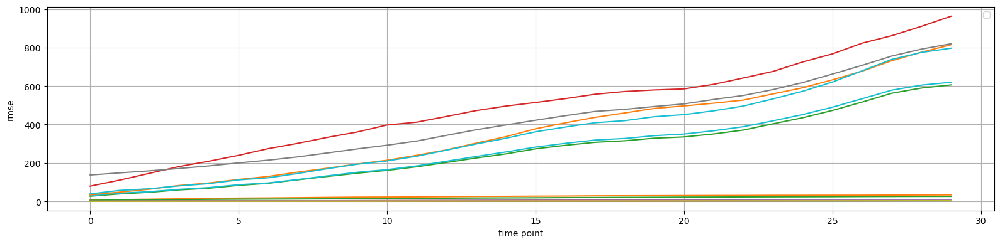

In [20]:
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=False, figsize=(16,4))
for rmsel in var_rmse:
    ax.plot(rmsel)
ax.set_xlabel("time point")
ax.set_ylabel("rmse")
ax.legend()
ax.grid()

In [ ]:
var_name='10u'

# Uncomment the below line to use pregenerated output files
# filename = '/g/data/wb00/admin/staging/FourCastNet/nci/predictions/baseline/nci/preds.zarr'

filename = 'output/pred.zarr'
with xr.open_zarr(filename, consolidated=False) as f0:
    pred = f0[var_name][:]  
with xr.open_zarr('output/gt.zarr', consolidated=False) as f1:
    ground_t = f1[var_name][:]
    
plt.rcParams['animation.embed_limit'] = 2**128    
plt.rcParams["figure.figsize"] = [10,10]
fig, ax = plt.subplots(2,1)
plt.setp(ax, xticks=np.arange(0, 1440, step=360), xticklabels=["360.0","270.0","180.0","90.0"],
         yticks=np.arange(0, 741, step=148), yticklabels=["90.0","54.0","18.0","-18.0","-54.0", "-90.0"] ) 
fig.set_tight_layout(False) 
ax[0].set_title("Prediction")
ax[1].set_title("Ground Truth")
plt.suptitle ("Inference_NCI") 
color_map ='Spectral_r'
inter = 'nearest'
mi = ground_t[0].values.min()
mx = ground_t[0].values.max()
def update(val):
   ax[0].imshow(pred[val,...], cmap=color_map, interpolation = inter , vmin=mi, vmax=mx) 
   ax[1].imshow(ground_t[val,...], cmap=color_map, interpolation = inter , vmin=mi, vmax=mx) 

ani = animation.FuncAnimation(fig, update, frames=len(pred))
plt.close()
from matplotlib import rc
rc('animation', html='jshtml')
ani

## 5. Ensembly inference with NCI raw ERA5 dataset

In [ ]:
%%time
%%bash -s "$time_range_beg" "$time_range_end" "$num_prediction"

python inference_nci/inference.py   --start_time=$1 \
  --end_time=$2 \
  --yaml_config ./config/AFNO.yaml \
  --checkpoint_dir='/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/pretrained' \
  --stats_dir='/g/data/wb00/admin/staging/FourCastNet/nvlab/v0/data/stats' \
  --output_path='./output/ens_pred.zarr' \
  --prediction_length=$3 \
  --ensemble_size=5

In [21]:
%matplotlib inline 
import h5py 
import matplotlib.colors as colors
import matplotlib.image as mpimg
from matplotlib import rcParams
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
var_rmse=[]
var_label=[]
for var_name in comm_var:
    var_label.append(var_name)
    with xr.open_zarr('output/ens_pred.zarr', consolidated=False) as f0:
        pred = f0[var_name][:]  
    with xr.open_zarr('output/gt.zarr', consolidated=False) as f1:
        ground_t = f1[var_name][:]    
    infer_rmse=[]
    for i in range(pred.shape[0]):
        RMSE=np.sqrt(np.mean((pred[i, ...].values - ground_t[i, ...].values) ** 2))    
        infer_rmse.append(RMSE)
    var_rmse.append(infer_rmse)
    
var_rmse=[]
var_label=[]
for var_name in comm_var:
    var_label.append(var_name)
    with xr.open_zarr('output/ens_pred.zarr', consolidated=False) as f0:
        pred = f0[var_name][:]  
    with xr.open_zarr('output/gt.zarr', consolidated=False) as f1:
        ground_t = f1[var_name][:]    
    infer_rmse=[]
    for i in range(pred.shape[0]):
        RMSE=np.sqrt(np.mean((pred[i, ...].values - ground_t[i, ...].values) ** 2))    
        infer_rmse.append(RMSE)
    var_rmse.append(infer_rmse)

2023-04-14 13:42:14,374 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


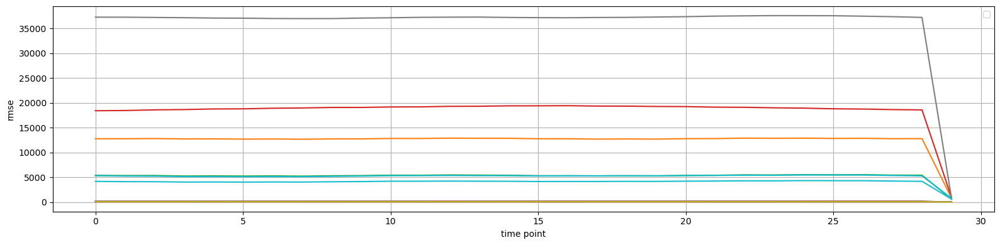

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=False, figsize=(16,4))
for rmsel in var_rmse:
    ax.plot(rmsel)
ax.set_xlabel("time point")
ax.set_ylabel("rmse")
ax.legend()
ax.grid()

In [ ]:
%matplotlib inline 
var_name='10u'
with xr.open_zarr('output/ens_pred.zarr', consolidated=False) as f0:
    pred = f0[var_name][:]  
with xr.open_zarr('output/gt.zarr', consolidated=False) as f1:
    ground_t = f1[var_name][:]
    
plt.rcParams['animation.embed_limit'] = 2**128    
plt.rcParams["figure.figsize"] = [10,10]
fig, ax = plt.subplots(2,1)
plt.setp(ax, xticks=np.arange(0, 1440, step=360), xticklabels=["360.0","270.0","180.0","90.0"],
         yticks=np.arange(0, 741, step=148), yticklabels=["90.0","54.0","18.0","-18.0","-54.0", "-90.0"] ) 
fig.set_tight_layout(False) 
ax[0].set_title("Prediction")
ax[1].set_title("Ground Truth")
plt.suptitle ("Inference_NCI") 
color_map ='Spectral_r'
inter = 'nearest'
mi = ground_t[0].values.min()
mx = ground_t[0].values.max()
def update(val):
   ax[0].imshow(pred[val,...], cmap=color_map, interpolation = inter , vmin=mi, vmax=mx) 
   ax[1].imshow(ground_t[val,...], cmap=color_map, interpolation = inter , vmin=mi, vmax=mx) 

ani = animation.FuncAnimation(fig, update, frames=len(pred))
plt.close()
from matplotlib import rc
rc('animation', html='jshtml')
ani